# Bank Marketing: Feature Extraction + EDA

## Imports

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder

In [3]:
bank_data = pd.read_csv(r"C:\Users\rgs88\OneDrive\Documents\Data Glacier Internship\Week 8\bank_data8.csv")
bank_data_ad = pd.read_csv(r"C:\Users\rgs88\OneDrive\Documents\Data Glacier Internship\Week 8\bank_data_ad8.csv")

### Pandas Profiling

In [4]:
from pandas_profiling import ProfileReport
# Create a Pandas Profiling Report
bank_profile=ProfileReport(bank_data, title="Pandas Profiling Report", explorative = True)
bank_profile

C:\Users\rgs88\anaconda3\lib\site-packages\numba\core\decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
C:\Users\rgs88\anaconda3\lib\site-packages\visions\backends\shared\nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
bank_profile1=ProfileReport(bank_data_ad, title="Pandas Profiling Report", explorative = True)
bank_profile1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Assessing Skewness and Kurtosis of Data

In [4]:
def data_statistics(df):
    statistics = []
    
    numeric_columns = df.select_dtypes(include=['number']).columns
    
    for column in numeric_columns:
        summary_stats = df[column].describe()
        skewness = df[column].skew()
        kurt = df[column].kurtosis()
        
        statistics.append({
            "Column": column,
            "Mean": summary_stats['mean'],
            "Std": summary_stats['std'],
            "Min": summary_stats['min'],
            "25%": summary_stats['25%'],
            "50%": summary_stats['50%'],
            "75%": summary_stats['75%'],
            "Max": summary_stats['max'],
            "Skewness": skewness,
            "Kurtosis": kurt
        })
    
    return pd.DataFrame(statistics)

In [5]:
# These are the numerical variable statistics
data_statistics(bank_data)

,Column,Mean,Std,Min,25%,50%,75%,Max,Skewness,Kurtosis
0,Unnamed: 0,27246.609701,13606.699599,0.0,15649.75,30053.0,40258.0,45210.0,-0.382291,-1.156324
1,age,41.278343,11.931140,18.0,32.00,39.0,49.0,95.0,0.830084,0.523048
2,balance,1560.964681,3217.514239,-8019.0,123.00,557.0,1757.0,102127.0,8.002689,129.560584
3,day,15.523158,8.402983,1.0,8.00,15.0,21.0,31.0,0.127174,-1.059363
4,duration,378.394620,348.680860,0.0,143.00,259.0,507.0,4918.0,2.102201,7.034606
5,campaign,2.487989,2.654505,1.0,1.00,2.0,3.0,63.0,5.202042,46.845684
6,pdays,52.574094,109.178244,-1.0,-1.00,-1.0,68.0,871.0,2.364278,6.192085
7,previous,0.839136,2.448042,0.0,0.00,0.0,1.0,275.0,23.306882,2050.097337


In [6]:
data_statistics(bank_data_ad)

,Column,Mean,Std,Min,25%,50%,75%,Max,Skewness,Kurtosis
0,Unnamed: 0,24883.772327,12391.462852,0.000,14490.250,27488.500,36749.000,41187.000,-0.386031,-1.150063
1,age,40.359499,12.031591,17.000,31.000,38.000,48.000,98.000,0.983943,1.076220
2,duration,387.386375,361.879025,0.000,144.000,265.000,526.000,4918.000,2.306671,9.346105
3,campaign,2.338930,2.371238,1.000,1.000,2.000,3.000,56.000,4.940679,42.735550
4,pdays,887.566234,313.438017,0.000,999.000,999.000,999.000,999.000,-2.457332,4.038752
5,previous,0.311315,0.690286,0.000,0.000,0.000,0.000,7.000,2.804043,9.613350
6,emp.var.rate,-0.499457,1.725742,-3.400,-1.800,-0.100,1.400,1.400,-0.146905,-1.553040
7,cons.price.idx,93.474135,0.633344,92.201,92.893,93.444,93.994,94.767,-0.111850,-0.966099
8,cons.conf.idx,-40.170349,5.376611,-50.800,-42.700,-41.800,-36.400,-26.900,0.341368,-0.453751
9,euribor3m,2.961638,1.890430,0.634,1.244,4.021,4.959,5.045,-0.018735,-1.922079


### Creating Diagnostic Plots of Numerical Variables

In [7]:
import scipy.stats

def diagnostic_plots(df, variable):
    # function takes a dataframe (df) and
    # the variable of interest as arguments

    # define figure size
    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df[variable], bins=30)
    plt.title('Histogram')

    # Q-Q plot
    plt.subplot(1, 3, 2)
    scipy.stats.probplot(df[variable], dist="norm", plot=plt)
    plt.ylabel('RM quantiles')

    # boxplot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df[variable])
    plt.title('Boxplot')

    plt.show()

In [8]:
bank_data

,Unnamed: 0,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79839,40987,76,retired,married,primary,no,3324,no,no,cellular,13,aug,227,2,192,1,failure,yes
79840,9441,38,management,single,tertiary,no,619,yes,no,unknown,6,jun,460,4,-1,0,unknown,yes
79841,27023,31,admin.,single,secondary,no,3950,yes,no,cellular,21,nov,529,1,-1,0,unknown,yes
79842,39774,33,management,married,tertiary,no,1323,no,no,cellular,1,jun,327,1,-1,0,unknown,yes


- Previous, Balance, Pdays, Duration, Campaign are all numerical variables which have ridiculous Skewness

- Duration, Campaign, pdays, previous, nr.employed

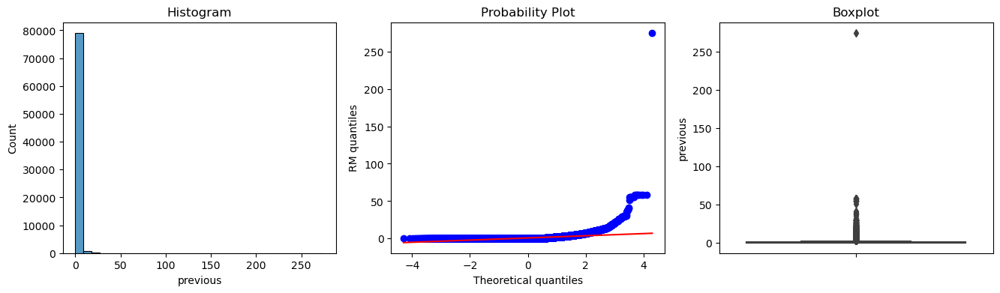

In [9]:
%matplotlib inline
diagnostic_plots(bank_data, "previous")

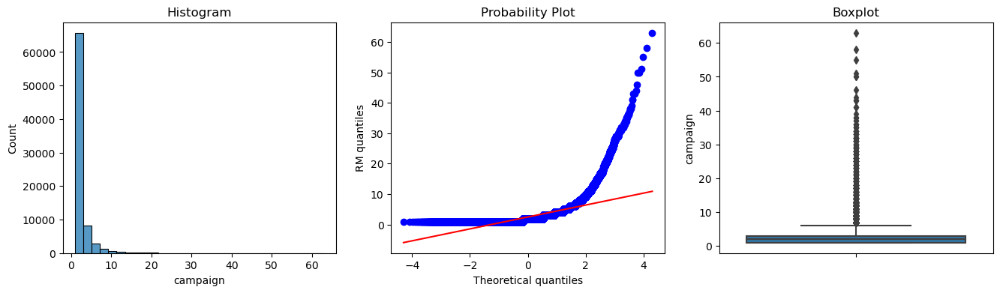

In [10]:
diagnostic_plots(bank_data, "campaign")

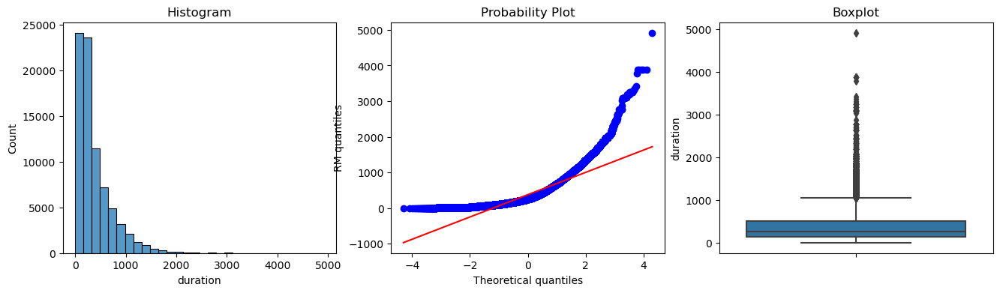

In [11]:
diagnostic_plots(bank_data, "duration")

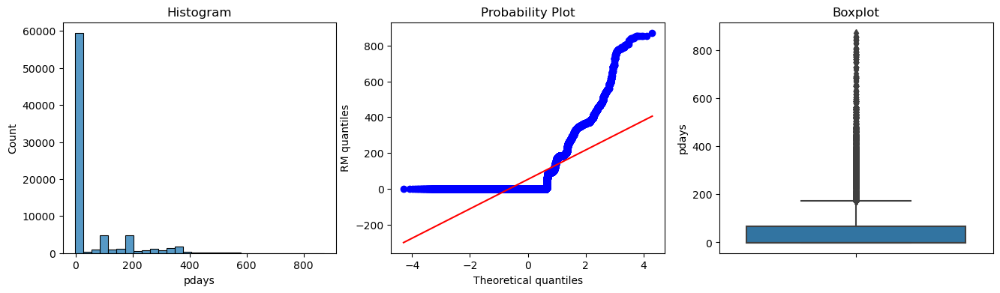

In [12]:
diagnostic_plots(bank_data, "pdays")

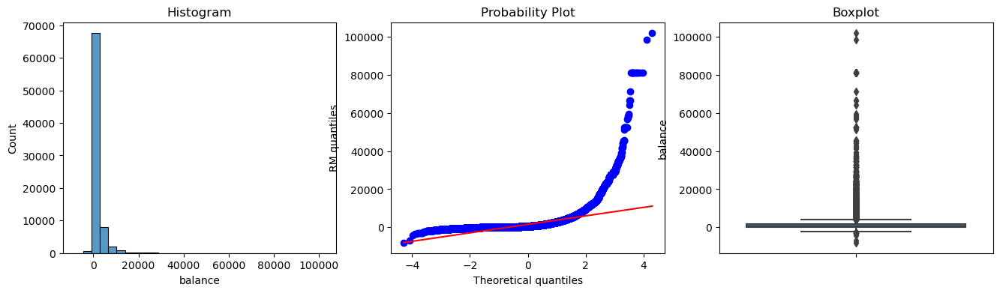

In [13]:
diagnostic_plots(bank_data, "balance")

For all these columns, we can see that the quantity of 0s is large, which leads to us excluding log transformations, and the number of outliers is very high so power transformers, minmax scalers and power transformers are used. A robustscaler would be preferred for this.

In [14]:
def find_outliers_iqr(df, threshold=1.5):
    outliers = {}
    
    for column in df.columns:
        try:
            numeric_data = pd.to_numeric(df[column])
            
            Q1 = np.percentile(numeric_data, 25)
            Q3 = np.percentile(numeric_data, 75)
            IQR = Q3 - Q1
            lower_bound = Q1 - threshold * IQR
            upper_bound = Q3 + threshold * IQR
            outlier_indices = np.where((numeric_data < lower_bound) | (numeric_data > upper_bound))[0]
            
            outliers[column] = {
                'count': len(outlier_indices),
                'indices': outlier_indices
            }
        except ValueError:
            pass  # Skip non-numeric columns
    
    return outliers

The bank data has an incredible large number of outliers, so we will use the robust scaler. Even when setting the the outlier threshold to 3.0 instead of 1.5, we still encounter a huge number of outliers.
The bank additional data has two columns with no outliers.

In [15]:
find_outliers_iqr(bank_data)

{'Unnamed: 0': {'count': 0, 'indices': array([], dtype=int64)},
 'age': {'count': 1125,
  'indices': array([27704, 27801, 27803, ..., 79813, 79835, 79839], dtype=int64)},
 'balance': {'count': 7525,
  'indices': array([   34,    65,    69, ..., 79792, 79796, 79833], dtype=int64)},
 'day': {'count': 0, 'indices': array([], dtype=int64)},
 'duration': {'count': 4415,
  'indices': array([   37,    43,    59, ..., 79808, 79818, 79827], dtype=int64)},
 'campaign': {'count': 4091,
  'indices': array([  743,   765,   887, ..., 79788, 79806, 79835], dtype=int64)},
 'pdays': {'count': 12352,
  'indices': array([22944, 22959, 22971, ..., 79836, 79839, 79843], dtype=int64)},
 'previous': {'count': 9087,
  'indices': array([22920, 22926, 22941, ..., 79829, 79836, 79843], dtype=int64)}}

In [16]:
find_outliers_iqr(bank_data_ad)

{'Unnamed: 0': {'count': 0, 'indices': array([], dtype=int64)},
 'age': {'count': 1386,
  'indices': array([26379, 26402, 26406, ..., 73022, 73033, 73072], dtype=int64)},
 'duration': {'count': 3598,
  'indices': array([   37,   159,   577, ..., 73029, 73038, 73062], dtype=int64)},
 'campaign': {'count': 3183,
  'indices': array([  868,  1024,  1074, ..., 72893, 72975, 73034], dtype=int64)},
 'pdays': {'count': 8200,
  'indices': array([22936, 23084, 23099, ..., 73068, 73069, 73071], dtype=int64)},
 'previous': {'count': 15944,
  'indices': array([22892, 22917, 22936, ..., 73068, 73069, 73071], dtype=int64)},
 'emp.var.rate': {'count': 0, 'indices': array([], dtype=int64)},
 'cons.price.idx': {'count': 0, 'indices': array([], dtype=int64)},
 'cons.conf.idx': {'count': 1755,
  'indices': array([35013, 35014, 35015, ..., 73008, 73035, 73044], dtype=int64)},
 'euribor3m': {'count': 0, 'indices': array([], dtype=int64)},
 'nr.employed': {'count': 0, 'indices': array([], dtype=int64)}}

In [17]:
from sklearn.preprocessing import RobustScaler

# Initialize the RobustScaler
scaler = RobustScaler()

# Create a list of numerical columns to be scaled
columns_to_standardise = ["duration", "pdays", "previous", "campaign", "balance"]

# Get the columns to scale and scale them
bank_data_columns = bank_data[columns_to_standardise]
scaled_data = scaler.fit_transform(bank_data_columns)

# Create a DataFrame with scaled columns
scaled_columns_df = pd.DataFrame(scaled_data, columns=columns_to_standardise)

# Drop the columns to be scaled from the original DataFrame
bank_data.drop(columns=columns_to_standardise, inplace=True)

# Concatenate the scaled columns DataFrame with the original DataFrame
bank_data_final = pd.concat([bank_data, scaled_columns_df], axis=1)

In [18]:
bank_data_ad.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73074 entries, 0 to 73073
Data columns (total 22 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      73074 non-null  int64  
 1   age             73074 non-null  int64  
 2   job             73074 non-null  object 
 3   marital         73074 non-null  object 
 4   education       73074 non-null  object 
 5   default         73074 non-null  object 
 6   housing         73074 non-null  object 
 7   loan            73074 non-null  object 
 8   contact         73074 non-null  object 
 9   month           73074 non-null  object 
 10  day_of_week     73074 non-null  object 
 11  duration        73074 non-null  int64  
 12  campaign        73074 non-null  int64  
 13  pdays           73074 non-null  int64  
 14  previous        73074 non-null  int64  
 15  poutcome        73074 non-null  object 
 16  emp.var.rate    73074 non-null  float64
 17  cons.price.idx  73074 non-null 

Now we repeat the same for bank_additional data

In [19]:
data_statistics(bank_data_ad)

,Column,Mean,Std,Min,25%,50%,75%,Max,Skewness,Kurtosis
0,Unnamed: 0,24883.772327,12391.462852,0.000,14490.250,27488.500,36749.000,41187.000,-0.386031,-1.150063
1,age,40.359499,12.031591,17.000,31.000,38.000,48.000,98.000,0.983943,1.076220
2,duration,387.386375,361.879025,0.000,144.000,265.000,526.000,4918.000,2.306671,9.346105
3,campaign,2.338930,2.371238,1.000,1.000,2.000,3.000,56.000,4.940679,42.735550
4,pdays,887.566234,313.438017,0.000,999.000,999.000,999.000,999.000,-2.457332,4.038752
5,previous,0.311315,0.690286,0.000,0.000,0.000,0.000,7.000,2.804043,9.613350
6,emp.var.rate,-0.499457,1.725742,-3.400,-1.800,-0.100,1.400,1.400,-0.146905,-1.553040
7,cons.price.idx,93.474135,0.633344,92.201,92.893,93.444,93.994,94.767,-0.111850,-0.966099
8,cons.conf.idx,-40.170349,5.376611,-50.800,-42.700,-41.800,-36.400,-26.900,0.341368,-0.453751
9,euribor3m,2.961638,1.890430,0.634,1.244,4.021,4.959,5.045,-0.018735,-1.922079


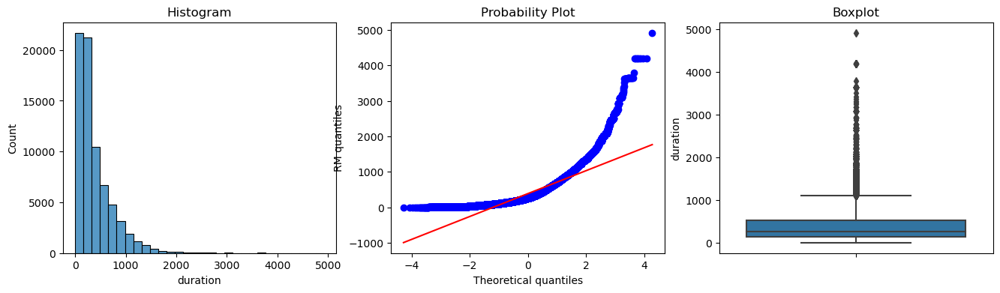

In [20]:
diagnostic_plots(bank_data_ad, "duration")

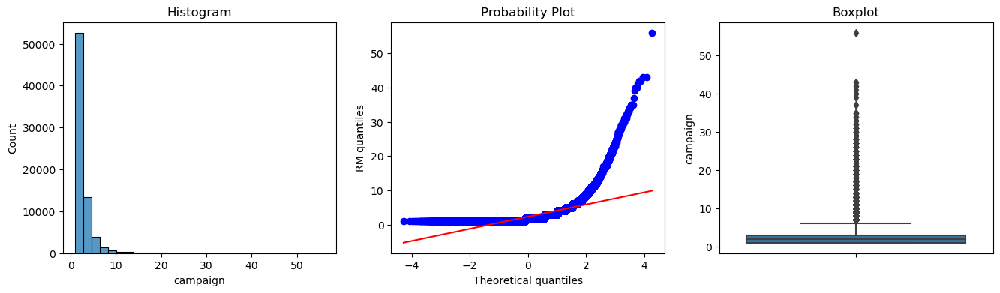

In [21]:
diagnostic_plots(bank_data_ad, "campaign")

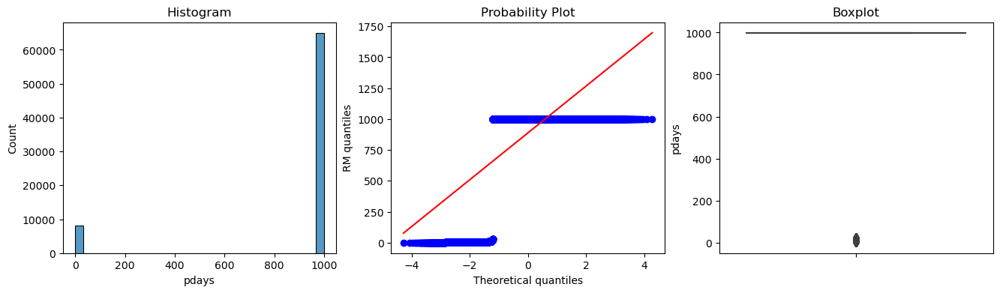

In [22]:
diagnostic_plots(bank_data_ad, "pdays")

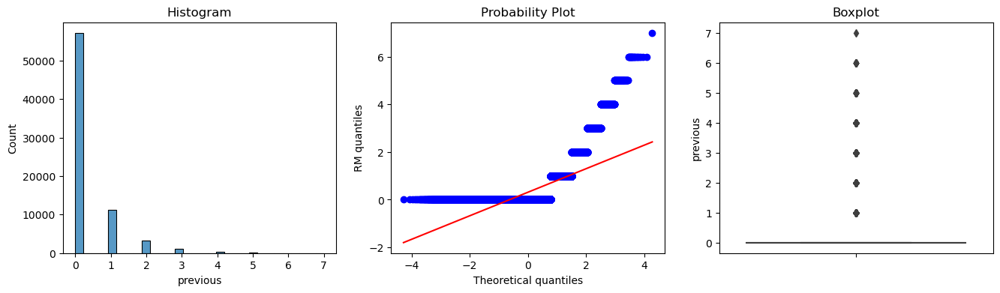

In [23]:
diagnostic_plots(bank_data_ad, "previous")

In [24]:
# Create a list of numerical columns to be scaled
columns_to_standardise_ad = ["pdays", "previous", "campaign", "previous"]

# Get the columns to scale and scale them
bank_data_ad_columns = bank_data_ad[columns_to_standardise_ad]
scaled_data_ad = scaler.fit_transform(bank_data_ad_columns)

# Create a DataFrame with scaled columns
scaled_columns_ad_df = pd.DataFrame(scaled_data_ad, columns=columns_to_standardise_ad)

# Drop the columns to be scaled from the original DataFrame
bank_data_ad.drop(columns=columns_to_standardise_ad, inplace=True)

# Concatenate the scaled columns DataFrame with the original DataFrame
bank_data_ad_final = pd.concat([bank_data_ad, scaled_columns_ad_df], axis=1)

In [25]:
bank_data_ad_final["nr.employed"]

0        5191.0
1        5191.0
2        5191.0
3        5191.0
4        5191.0
          ...  
73069    4963.6
73070    5076.2
73071    5017.5
73072    5099.1
73073    5008.7
Name: nr.employed, Length: 73074, dtype: float64

In [26]:
bank_data_final

,Unnamed: 0,age,job,marital,education,default,housing,loan,contact,day,month,poutcome,y,duration,pdays,previous,campaign,balance
0,0,58,management,married,tertiary,no,yes,no,unknown,5,may,unknown,no,0.005495,0.000000,0.0,-0.5,0.970624
1,1,44,technician,single,secondary,no,yes,no,unknown,5,may,unknown,no,-0.296703,0.000000,0.0,-0.5,-0.323133
2,2,33,entrepreneur,married,secondary,no,yes,yes,unknown,5,may,unknown,no,-0.502747,0.000000,0.0,-0.5,-0.339657
3,3,47,blue-collar,married,unknown,no,yes,no,unknown,5,may,unknown,no,-0.458791,0.000000,0.0,-0.5,0.580783
4,4,33,unknown,single,unknown,no,no,no,unknown,5,may,unknown,no,-0.167582,0.000000,0.0,-0.5,-0.340269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79839,40987,76,retired,married,primary,no,no,no,cellular,13,aug,failure,yes,-0.087912,2.797101,1.0,0.0,1.693390
79840,9441,38,management,single,tertiary,no,yes,no,unknown,6,jun,unknown,yes,0.552198,0.000000,0.0,1.0,0.037944
79841,27023,31,admin.,single,secondary,no,yes,no,cellular,21,nov,unknown,yes,0.741758,0.000000,0.0,-0.5,2.076499
79842,39774,33,management,married,tertiary,no,no,no,cellular,1,jun,unknown,yes,0.186813,0.000000,0.0,-0.5,0.468788


In [27]:
bank_data_ad_final.poutcome.value_counts()

nonexistent    57130
failure         8381
success         7563
Name: poutcome, dtype: int64

### Mapping Categorical Variables to Values

In [28]:
label_encoder = LabelEncoder()

bank_data_final['marital'] = label_encoder.fit_transform(bank_data_final['marital'])
bank_data_final['education'] = label_encoder.fit_transform(bank_data_final['education'])
bank_data_final['month'] = label_encoder.fit_transform(bank_data_final['month'])
bank_data_final['contact'] = label_encoder.fit_transform(bank_data_final['contact'])
bank_data_final['poutcome'] = label_encoder.fit_transform(bank_data_final['poutcome'])
bank_data_final['job'] = label_encoder.fit_transform(bank_data_final['job'])

In [29]:
# # Encoding Categorical Variables into Numerical Variables for Model Selection

# # Marital Variable
# marital_mapping = {'single': 0, 'married': 1, 'divorced': 2}
# bank_data_final['marital'] = bank_data_final['marital'].map(marital_mapping).astype(int)

# # Education Variable
# education_mapping = {'primary': 0, 'secondary': 1, 'tertiary': 2, 'unknown': 3}
# bank_data_final['education'] = bank_data_final['education'].map(education_mapping).astype(int)

# # Month Variable
# month_mapping = {'jan': 0, 'feb': 1, 'mar': 2, 'apr': 3, 'may': 4, 'jun': 5,
#                  'jul': 6, 'aug': 7, 'sep': 8, 'oct': 9, 'nov': 10, 'dec': 11}
# bank_data_final['month'] = bank_data_final['month'].map(month_mapping).astype(int)

# # Contact Variable
# contact_mapping = {'cellular': 0, 'telephone': 1, 'unknown': 2}
# bank_data_final['contact'] = bank_data_final['contact'].map(contact_mapping).astype(int)

# # P-outcome Variable
# poutcome_mapping = {'success': 0, 'other': 1, 'failure': 2, 'unknown': 3}
# bank_data_final['poutcome'] = bank_data_final['poutcome'].map(poutcome_mapping).astype(int)

# # Job Variable
# job_mapping = {'blue-collar': 0, 'management': 1, 'technician': 2, 'admin.': 3, 'services': 4, 
#                'retired': 5, 'self-employed': 6, 'entrepreneur': 7, 'unemployed': 8, 
#                'housemaid': 9, 'student': 10, 'unknown': 11}
# bank_data_final['job'] = bank_data_final['job'].map(job_mapping).astype(int)

In [40]:
bank_data_ad_final['marital'] = label_encoder.fit_transform(bank_data_ad_final['marital'])
bank_data_ad_final['education'] = label_encoder.fit_transform(bank_data_ad_final['education'])
bank_data_ad_final['default'] = label_encoder.fit_transform(bank_data_ad_final['default'])
bank_data_ad_final['housing'] = label_encoder.fit_transform(bank_data_ad_final['housing'])
bank_data_ad_final['loan'] = label_encoder.fit_transform(bank_data_ad_final['loan'])
bank_data_ad_final['contact'] = label_encoder.fit_transform(bank_data_ad_final['contact'])
bank_data_ad_final['month'] = label_encoder.fit_transform(bank_data_ad_final['month'])
bank_data_ad_final['job'] = label_encoder.fit_transform(bank_data_ad_final['job'])
bank_data_ad_final['poutcome'] = label_encoder.fit_transform(bank_data_ad_final['poutcome'])
bank_data_ad_final['day_of_week'] = label_encoder.fit_transform(bank_data_ad_final['day_of_week'])

In [31]:
# # Encoding Categorical Variables into Numerical Variables for Model Selection

# # Marital Variable
# marital_mapping = {'single': 0, 'married': 1, 'divorced': 2, 'unknown': 3}
# bank_data_ad_final['marital'] = bank_data_ad_final['marital'].map(marital_mapping).astype(int)

# # Education Variable
# education_mapping = {
#     'university.degree': 0,
#     'high.school': 1,
#     'basic.9y': 2,
#     'professional.course': 3,
#     'basic.4y': 4,
#     'basic.6y': 5,
#     'unknown': 6,
#     'illiterate': 7
# }
# bank_data_ad_final['education'] = bank_data_ad_final['education'].map(education_mapping)

# # Default Variable
# default_mapping = {
#     'no': 0,
#     'yes': 1,
#     'unknown': 2
# }
# bank_data_ad_final['default'] = bank_data_ad_final['default'].map(default_mapping)

# # Housing Variable
# housing_mapping = {
#     'no': 0,
#     'yes': 1,
#     'unknown': 2
# }
# bank_data_ad_final['housing'] = bank_data_ad_final['housing'].map(housing_mapping)

# # Loan Variable
# loan_mapping = {
#     "no": 0,
#     "yes": 1,
#     "unknown": 2
# }
# bank_data_ad_final['loan'] = bank_data_ad_final['loan'].map(loan_mapping)

# # Contact Variable
# contact_mapping = {
#     "cellular": 0,
#     "telephone": 1,
# }
# bank_data_ad_final['contact'] = bank_data_ad_final['contact'].map(contact_mapping)

# # Month Variable
# month_mapping = {'jan': 0, 'feb': 1, 'mar': 2, 'apr': 3, 'may': 4, 'jun': 5,
#                  'jul': 6, 'aug': 7, 'sep': 8, 'oct': 9, 'nov': 10, 'dec': 11}
# bank_data_ad_final['month'] = bank_data_ad_final['month'].map(month_mapping).astype(int)

# #Job Mapping
# job_mapping = {'blue-collar': 0, 'management': 1, 'technician': 2, 'admin.': 3, 'services': 4, 
#                'retired': 5, 'self-employed': 6, 'entrepreneur': 7, 'unemployed': 8, 
#                'housemaid': 9, 'student': 10, 'unknown': 11}
# bank_data_ad_final['job'] = bank_data_ad_final['job'].map(job_mapping).astype(int)

# # P-Outcome Mapping
# poutcome_mapping = {'failure': 0, 'success': 1, 'nonexistent': 2}
# bank_data_ad_final['poutcome'] = bank_data_ad_final['poutcome'].map(poutcome_mapping).astype(int)

In [32]:
bank_data_ad_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73074 entries, 0 to 73073
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      73074 non-null  int64  
 1   age             73074 non-null  int64  
 2   job             73074 non-null  int32  
 3   marital         73074 non-null  int32  
 4   education       73074 non-null  int64  
 5   default         73074 non-null  int64  
 6   housing         73074 non-null  int64  
 7   loan            73074 non-null  int64  
 8   contact         73074 non-null  int64  
 9   month           73074 non-null  int32  
 10  day_of_week     73074 non-null  object 
 11  duration        73074 non-null  int64  
 12  poutcome        73074 non-null  int32  
 13  emp.var.rate    73074 non-null  float64
 14  cons.price.idx  73074 non-null  float64
 15  cons.conf.idx   73074 non-null  float64
 16  euribor3m       73074 non-null  float64
 17  nr.employed     73074 non-null 

In [34]:
bank_data_ad_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73074 entries, 0 to 73073
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      73074 non-null  int64  
 1   age             73074 non-null  int64  
 2   job             73074 non-null  int32  
 3   marital         73074 non-null  int32  
 4   education       73074 non-null  int64  
 5   default         73074 non-null  int64  
 6   housing         73074 non-null  int64  
 7   loan            73074 non-null  int64  
 8   contact         73074 non-null  int64  
 9   month           73074 non-null  int32  
 10  day_of_week     73074 non-null  int32  
 11  duration        73074 non-null  int64  
 12  poutcome        73074 non-null  int32  
 13  emp.var.rate    73074 non-null  float64
 14  cons.price.idx  73074 non-null  float64
 15  cons.conf.idx   73074 non-null  float64
 16  euribor3m       73074 non-null  float64
 17  nr.employed     73074 non-null 

In [38]:
bank_data_final

,Unnamed: 0,age,job,marital,education,default,housing,loan,contact,day,month,poutcome,y,duration,pdays,previous,campaign,balance
0,0,58,1,1,2,no,yes,no,2,5,4,3,no,0.005495,0.000000,0.0,-0.5,0.970624
1,1,44,2,0,1,no,yes,no,2,5,4,3,no,-0.296703,0.000000,0.0,-0.5,-0.323133
2,2,33,7,1,1,no,yes,yes,2,5,4,3,no,-0.502747,0.000000,0.0,-0.5,-0.339657
3,3,47,0,1,3,no,yes,no,2,5,4,3,no,-0.458791,0.000000,0.0,-0.5,0.580783
4,4,33,11,0,3,no,no,no,2,5,4,3,no,-0.167582,0.000000,0.0,-0.5,-0.340269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79839,40987,76,5,1,0,no,no,no,0,13,7,2,yes,-0.087912,2.797101,1.0,0.0,1.693390
79840,9441,38,1,0,2,no,yes,no,2,6,5,3,yes,0.552198,0.000000,0.0,1.0,0.037944
79841,27023,31,3,0,1,no,yes,no,0,21,10,3,yes,0.741758,0.000000,0.0,-0.5,2.076499
79842,39774,33,1,1,2,no,no,no,0,1,5,3,yes,0.186813,0.000000,0.0,-0.5,0.468788


In [31]:
def map_boolean_columns_to_binary(df):
    for column in df.columns:
        unique_values = df[column].unique()
        if len(unique_values) == 2 and "yes" in unique_values and "no" in unique_values:
            df[column] = df[column].map({"no": 0, "yes": 1})
    return df

In [35]:
bank_data_final_1 = map_boolean_columns_to_binary(bank_data_final)

C:\Users\rgs88\AppData\Local\Temp\ipykernel_2580\3911455739.py:4: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if len(unique_values) == 2 and "yes" in unique_values and "no" in unique_values:


In [36]:
bank_data_final_1

,Unnamed: 0,age,job,marital,education,default,housing,loan,contact,day,month,poutcome,y,duration,pdays,previous,campaign,balance
0,0,58,4,1,2,0,1,0,2,5,8,3,0,0.005495,0.000000,0.0,-0.5,0.970624
1,1,44,9,2,1,0,1,0,2,5,8,3,0,-0.296703,0.000000,0.0,-0.5,-0.323133
2,2,33,2,1,1,0,1,1,2,5,8,3,0,-0.502747,0.000000,0.0,-0.5,-0.339657
3,3,47,1,1,3,0,1,0,2,5,8,3,0,-0.458791,0.000000,0.0,-0.5,0.580783
4,4,33,11,2,3,0,0,0,2,5,8,3,0,-0.167582,0.000000,0.0,-0.5,-0.340269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79839,40987,76,5,1,0,0,0,0,0,13,1,0,1,-0.087912,2.797101,1.0,0.0,1.693390
79840,9441,38,4,2,2,0,1,0,2,6,6,3,1,0.552198,0.000000,0.0,1.0,0.037944
79841,27023,31,0,2,1,0,1,0,0,21,9,3,1,0.741758,0.000000,0.0,-0.5,2.076499
79842,39774,33,4,1,2,0,0,0,0,1,6,3,1,0.186813,0.000000,0.0,-0.5,0.468788


In [37]:
bank_data_final

,Unnamed: 0,age,job,marital,education,default,housing,loan,contact,day,month,poutcome,y,duration,pdays,previous,campaign,balance
0,0,58,4,1,2,0,1,0,2,5,8,3,0,0.005495,0.000000,0.0,-0.5,0.970624
1,1,44,9,2,1,0,1,0,2,5,8,3,0,-0.296703,0.000000,0.0,-0.5,-0.323133
2,2,33,2,1,1,0,1,1,2,5,8,3,0,-0.502747,0.000000,0.0,-0.5,-0.339657
3,3,47,1,1,3,0,1,0,2,5,8,3,0,-0.458791,0.000000,0.0,-0.5,0.580783
4,4,33,11,2,3,0,0,0,2,5,8,3,0,-0.167582,0.000000,0.0,-0.5,-0.340269
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79839,40987,76,5,1,0,0,0,0,0,13,1,0,1,-0.087912,2.797101,1.0,0.0,1.693390
79840,9441,38,4,2,2,0,1,0,2,6,6,3,1,0.552198,0.000000,0.0,1.0,0.037944
79841,27023,31,0,2,1,0,1,0,0,21,9,3,1,0.741758,0.000000,0.0,-0.5,2.076499
79842,39774,33,4,1,2,0,0,0,0,1,6,3,1,0.186813,0.000000,0.0,-0.5,0.468788


In [38]:
bank_data_ad_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73074 entries, 0 to 73073
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      73074 non-null  int64  
 1   age             73074 non-null  int64  
 2   job             73074 non-null  int32  
 3   marital         73074 non-null  int32  
 4   education       73074 non-null  int32  
 5   default         73074 non-null  int32  
 6   housing         73074 non-null  int32  
 7   loan            73074 non-null  int32  
 8   contact         73074 non-null  int32  
 9   month           73074 non-null  int32  
 10  day_of_week     73074 non-null  object 
 11  duration        73074 non-null  int64  
 12  poutcome        73074 non-null  int32  
 13  emp.var.rate    73074 non-null  float64
 14  cons.price.idx  73074 non-null  float64
 15  cons.conf.idx   73074 non-null  float64
 16  euribor3m       73074 non-null  float64
 17  nr.employed     73074 non-null 

### Exporting these pre-processed datasets for model building

In [39]:
bank_data_final_1.to_csv(r"C:\Users\rgs88\OneDrive\Documents\Data Glacier Internship\Week 11\bank_data11.csv")
bank_data_ad_final.to_csv(r"C:\Users\rgs88\OneDrive\Documents\Data Glacier Internship\Week 11\bank_data_ad11.csv")